# Step 0 : Imports Libraries

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score

sns.set_theme(style='white', palette='summer')

# Step 1 : Read Data

In [2]:
df = pd.read_csv('avocado.csv')

In [3]:
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


In [4]:
# cheking data shape
df.shape

(18249, 14)

The dataset have 18249 rows and 14 columns

In [5]:
# Cheking null values
df.isna().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [6]:
# Cheking duplicating value
df.duplicated().sum()

0

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


# Step 2 : Clean Data

In [8]:
df = df.drop('Unnamed: 0', axis = 1)

In [9]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


# Step 3 : EDA

Text(0, 0.5, 'Average Price')

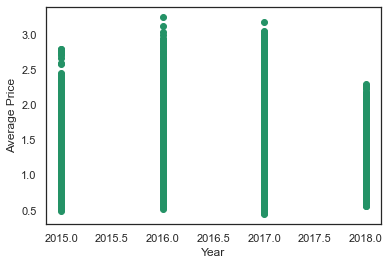

In [10]:
# Scatter Plot between Average Price and Year

plt.scatter(df['year'], df['AveragePrice'])
plt.xlabel('Year')
plt.ylabel('Average Price')

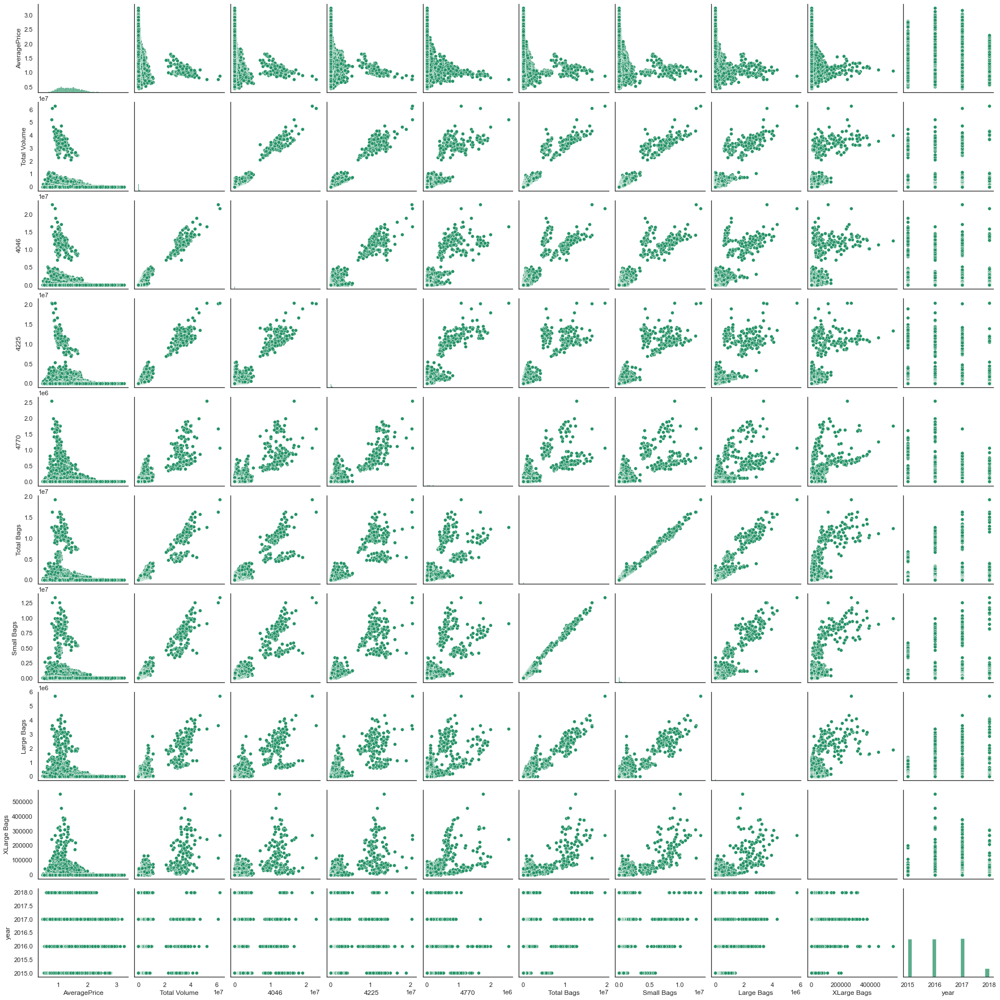

In [11]:
sns.pairplot(df, palette='summer')

In [12]:
df_mini1 = df[['Total Volume', '4046']]
df_mini2 = df[['Total Volume', '4225']]
df_mini3 = df[['Total Volume', '4770']]

In [13]:
df_mini1.head()

,Total Volume,4046
0,64236.62,1036.74
1,54876.98,674.28
2,118220.22,794.70
3,78992.15,1132.00
4,51039.60,941.48


In [14]:
df_corr1 = df_mini1.corr()
df_corr2 = df_mini2.corr()
df_corr3 = df_mini3.corr()

In [15]:
df_corr1

,Total Volume,4046
Total Volume,1.000000,0.977863
4046,0.977863,1.000000


In [16]:
df_corr2

,Total Volume,4225
Total Volume,1.000000,0.974181
4225,0.974181,1.000000


In [17]:
df_corr3

,Total Volume,4770
Total Volume,1.000000,0.872202
4770,0.872202,1.000000


<AxesSubplot:title={'center':'Correlation b/w Total Vol & 4770 Labeled Avocados'}>

<Figure size 432x288 with 0 Axes>

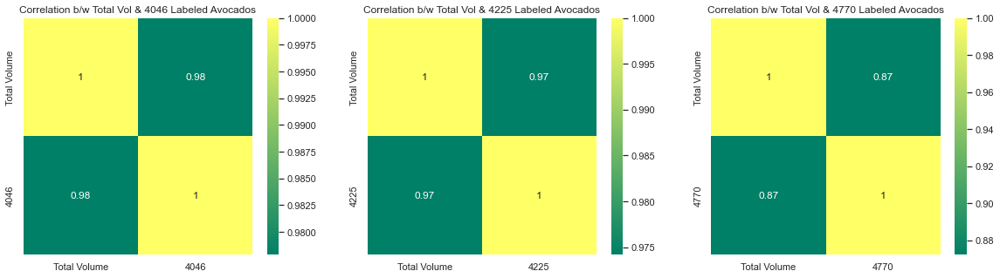

In [18]:
# Correlation between each type of labeled Avocados and Total Volume of Avocados

fig1 = plt.figure()
fig1, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(20,5))
axes[0].set_title('Correlation b/w Total Vol & 4046 Labeled Avocados')
axes[1].set_title('Correlation b/w Total Vol & 4225 Labeled Avocados')
axes[2].set_title('Correlation b/w Total Vol & 4770 Labeled Avocados')
sns.heatmap(df_corr1, ax = axes[0], annot = True, cmap = 'summer')
sns.heatmap(df_corr2, ax = axes[1], annot = True, cmap = 'summer')
sns.heatmap(df_corr3, ax = axes[2], annot = True, cmap = 'summer')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53]),
 [Text(0, 0, 'Albany'),
  Text(1, 0, 'Atlanta'),
  Text(2, 0, 'BaltimoreWashington'),
  Text(3, 0, 'Boise'),
  Text(4, 0, 'Boston'),
  Text(5, 0, 'BuffaloRochester'),
  Text(6, 0, 'California'),
  Text(7, 0, 'Charlotte'),
  Text(8, 0, 'Chicago'),
  Text(9, 0, 'CincinnatiDayton'),
  Text(10, 0, 'Columbus'),
  Text(11, 0, 'DallasFtWorth'),
  Text(12, 0, 'Denver'),
  Text(13, 0, 'Detroit'),
  Text(14, 0, 'GrandRapids'),
  Text(15, 0, 'GreatLakes'),
  Text(16, 0, 'HarrisburgScranton'),
  Text(17, 0, 'HartfordSpringfield'),
  Text(18, 0, 'Houston'),
  Text(19, 0, 'Indianapolis'),
  Text(20, 0, 'Jacksonville'),
  Text(21, 0, 'LasVegas'),
  Text(22, 0, 'LosAngeles'),
  Text(23, 0, 'Louisville'),
  Text(24, 0, 'MiamiFtLauderdale'),
  Text(25, 0, 'M

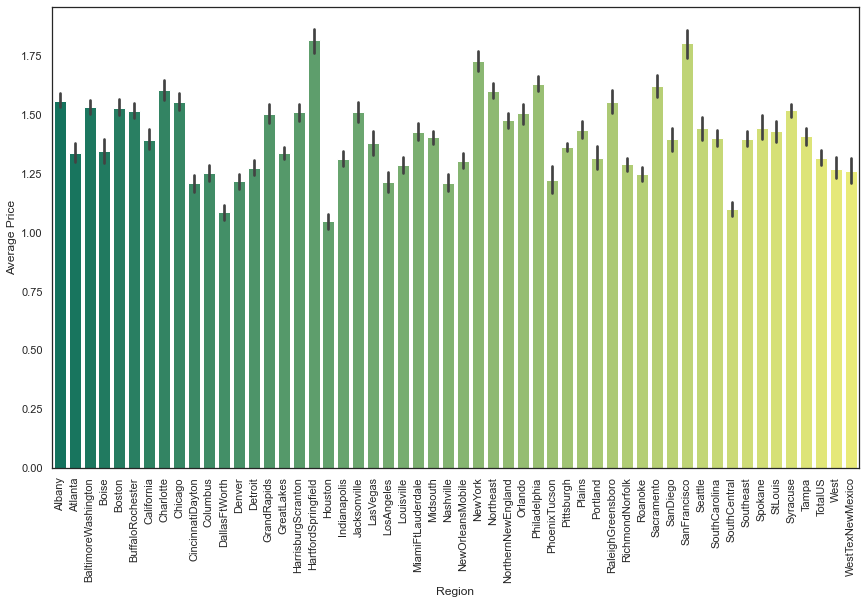

In [19]:
# Barplot between Region and Average Price of that region

fig2 = plt.figure(figsize = (14,8))
axes4 = fig2.add_axes([0.1, 0.1, 0.8, 0.8])
sns.barplot(x = df['region'], y = df['AveragePrice'], ax = axes4, palette='summer')
axes4.set_xlabel('Region')
axes4.set_ylabel('Average Price')
plt.xticks(rotation=90)

The geography influences the price.

In [20]:
# There are two types of Avocado, so let's try to distribute each one.

import plotly.express as px
import plotly.graph_objects as go

#conventional = df[df['type'] == 'conventional']
#organic = df[df['type'] == 'organic']

fig = go.Figure(
    layout=go.Layout(
        title="Type",
        width=500,
        height=500,
    ))
fig.add_trace(go.Histogram(x=df[df.type == 'organic'].AveragePrice))
fig.add_trace(go.Histogram(x=df[df.type == 'conventional'].AveragePrice))
fig = px.histogram(df, x='AveragePrice', color='type',
                   marginal='box', # or violin, rug
                   hover_data=df.columns
                   , color_discrete_sequence=['#E9EA79', '#14725D']
                      )
for template in ["simple_white"]:
    fig.update_layout(template=template, title="Average Price")
    
    fig.show()

Organic avocados are more expensive

# Step 4 : Model

In [21]:
df1 = df.copy()

In [22]:
# Creating new feature = 'season'


df1['Date'] = pd.to_datetime(df1['Date'])
df1['month'] = df1['Date'].dt.month

conditions = [(df1['month'].between(3,5)),
           (df1['month'].between(6,8)),
           (df1['month'].between(9,11)),
           (df1['month'].between(12,2))]

values = [0,1,2,3]
#spring = 0, summer = 1, fall = 2, winter = 3
df1['seasons'] = np.select(conditions, values)

In [23]:
df1.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,seasons
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,0
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,0
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,0
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,0
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,2


In [24]:
# Label Encoding for 'type'

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1['type'] = le.fit_transform(df1['type'])

# and region (One Hot Encoding instead of labelizing)
ohe = pd.get_dummies(data=df1, columns=['region'])

x = ohe.drop(['AveragePrice','Date','4046','4225','4770','Small Bags','Large Bags','XLarge Bags'], axis=1)
y = df1['AveragePrice']

In [25]:
from sklearn.model_selection import train_test_split

In [26]:
x_train, x_test, y_train, y_test=train_test_split(x, y, test_size=0.2, random_state=42)

In [27]:
# Appling Linear Regression

from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [28]:
x_train

,Total Volume,Total Bags,type,year,month,seasons,region_Albany,region_Atlanta,region_BaltimoreWashington,region_Boise,...,region_SouthCarolina,region_SouthCentral,region_Southeast,region_Spokane,region_StLouis,region_Syracuse,region_Tampa,region_TotalUS,region_West,region_WestTexNewMexico
16391,5376.58,4357.77,1,2017,11,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4990,578610.94,248519.50,0,2016,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13653,6470.08,1914.81,1,2016,11,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2074,145648.40,28554.64,0,2015,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12377,40535.05,1695.56,1,2016,6,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,12946.65,342.37,1,2015,6,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11964,1193.06,820.15,1,2016,5,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5390,83407.69,26695.90,0,2016,5,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
860,277578.88,92380.65,0,2015,6,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [29]:
y_train

16391    1.88
4990     0.81
13653    2.01
2074     1.02
12377    1.53
         ... 
11284    1.55
11964    1.55
5390     1.31
860      1.13
15795    1.35
Name: AveragePrice, Length: 14599, dtype: float64

In [30]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


In [31]:
lr.fit(x_train, y_train)

LinearRegression()

In [32]:
y_pred = lr.predict(x_test)

In [33]:
y_pred

array([1.01943894, 1.25872277, 1.55956261, ..., 0.87095834, 1.80502534,
       2.05944915])

In [34]:
from sklearn.metrics import r2_score, accuracy_score

pipe0 = Pipeline([('scaler', StandardScaler()), ('lr', LinearRegression())])
pipe0.fit(x_train, y_train)
y_pred0 = pipe0.predict(x_test)
r2_score(y_test, y_pred0)

0.6066713197469706

In [35]:
# Appling Random Forest 

from sklearn.ensemble import RandomForestRegressor

pipe = Pipeline([('scaler', StandardScaler()), ('rf', RandomForestRegressor())])
pipe.fit(x_train, y_train)
y_pred = pipe.predict(x_test)
r2_score(y_test, y_pred)

0.9047796420010338

In [36]:
from xgboost import XGBRegressor

pipe2 = Pipeline([('scaler', StandardScaler()), ('xgb', XGBRegressor())])
pipe2.fit(x_train, y_train)
y_pred2 = pipe2.predict(x_test)
r2_score(y_test, y_pred2)

0.9048732899528339

The both regressors got the same score, which mean their performance is comparable.

In [37]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


# Step 5: Conclusion

The questions were answered clearly.

The linear regression and random forest didn’t affect by numerical values. 

The both regressors got the same score, which mean their performance is comparable.

For next step may create a form to making search easier to people who interesting avocado to enter the avocado product number and got a brief describe about it.